## Machine Learning in E-commerce
### Predicting price of products using support vector regression (SVR)

#### Student name: Alexander Berg
#### Student id: h17alebe

In [1]:
import time 
import csv 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.graph_objects as go
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.utils import shuffle
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV,train_test_split, cross_val_score
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score


%matplotlib inline

plt.rcParams['figure.figsize'] = (10, 6)
pd.set_option('max_columns', 40)

print('All libraries imported..')

All libraries imported..


In [2]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

In [3]:
start = time.time()
customers = pd.read_csv('data/olist_customers_dataset.csv')
items = pd.read_csv('data/olist_order_items_dataset.csv')
payments = pd.read_csv('data/olist_order_payments_dataset.csv')
reviews = pd.read_csv('data/olist_order_reviews_dataset.csv')
orders = pd.read_csv('data/olist_orders_dataset.csv')
categories = pd.read_csv('data/product_category_name_translation.csv')
products = pd.read_csv('data/olist_products_dataset.csv')
sellers = pd.read_csv('data/olist_sellers_dataset.csv')
end = time.time()
print('Dataframes are ready..')
print('Reading time: ',(end-start),'sec')

Dataframes are ready..
Reading time:  1.1045928001403809 sec


In [4]:
df = pd.merge(orders,payments, on= 'order_id')
df = df.merge(customers, on= 'customer_id')
df = df.merge(items, on= 'order_id')
df = df.merge(products, on= 'product_id')
df = df.merge(categories, on= 'product_category_name')
df = df.merge(reviews, on= 'order_id')

print('Dataframes merged..')

Dataframes merged..


In [5]:
tab_info_df=pd.DataFrame(df.dtypes).T.rename(index={0:'column type'})
tab_info_df=tab_info_df.append(pd.DataFrame(df.isnull().sum()).T.rename(index={0:'null values (no)'}))
tab_info_df=tab_info_df.append(pd.DataFrame(df.isnull().sum()/df.shape[0]*100).T.
                         rename(index={0:'null values (%)'}))
display(tab_info_df)

display(df[:5])

print('Dimensions: ', df.shape)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
column type,object,object,object,object,object,object,object,object,int64,object,int64,float64,object,int64,object,object,int64,object,object,object,float64,float64,object,float64,float64,float64,float64,float64,float64,float64,object,object,int64,object,object,object,object
null values (no),0,0,0,0,14,1213,2515,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,102585,66703,0,0
null values (%),0.0,0.0,0.0,0.0,0.012009,1.040478,2.157298,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000858,0.000858,0.000858,0.000858,0.0,0.0,0.0,87.994613,57.216013,0.0,0.0


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,credit_card,1,18.12,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,3,voucher,1,2.00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2,voucher,1,18.59,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1,credit_card,3,37.77,3a51803cc0d012c3b5dc8b7528cb05f7,3366,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-21 20:05:16,29.99,7.78,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,b46f1e34512b0f4c74a72398b03ca788,4,NaN,Deveriam embalar melhor o produto. A caixa vei...,2017-08-19 00:00:00,2017-08-20 15:16:36
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15 00:00:00,1,credit_card,1,37.77,ef0996a1a279c26e7ecbd737be23d235,2290,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-08 18:37:31,29.99,7.78,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,dc90f19c2806f1abba9e72ad3c350073,5,NaN,"Só achei ela pequena pra seis xícaras ,mais é ...",2017-08-08 00:00:00,2017-08-08 23:26:23


Dimensions:  (116581, 37)


In [6]:
df = df.drop_duplicates(subset=['order_id','order_purchase_timestamp','product_id','customer_unique_id','review_comment_message'])
df.shape

(101195, 37)

In [7]:
df.rename(columns={'purchase_timestamp':'purchase_date', 'order_estimated_delivery_date':'estimated_delivery_date','order_delivered_customer_date':'delivered_to_customer_date','order_delivered_carrier_date':'delivered_to_carrier_date','payment_installments':'installments', 'payment_value':'transaction_value','freight_value':'freight_price','product_category_name_english':'category_name'}, inplace=True)

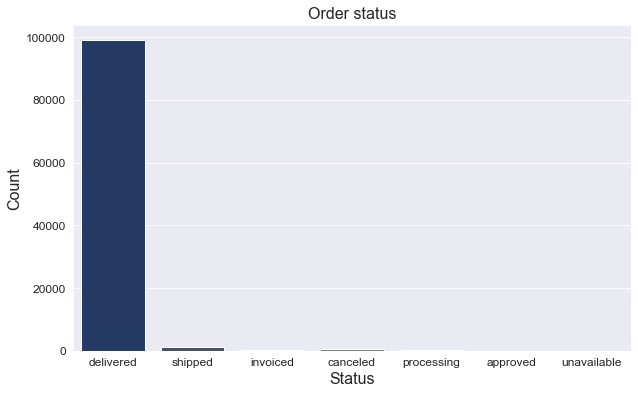

delivered      99018
shipped         1107
canceled         450
invoiced         318
processing       293
unavailable        7
approved           2
Name: order_status, dtype: int64


In [8]:
sns.set_style('darkgrid')

ax = sns.countplot(x='order_status', data=df, palette='cividis')

plt.title('Order status', fontsize=16)
plt.xlabel('Status', fontsize=16)
plt.ylabel('Count', fontsize=16)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()
print(df['order_status'].value_counts())

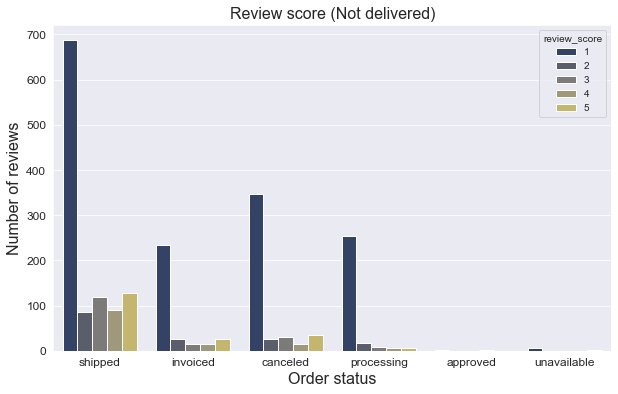

In [9]:
sns.set_style('darkgrid')
ax = sns.countplot(x='order_status', data=df[df['order_status'] != 'delivered'], hue='review_score', palette='cividis')

plt.title('Review score (Not delivered)', fontsize=16)
plt.xlabel('Order status', fontsize=16)
plt.ylabel('Number of reviews', fontsize=16)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='review_score', loc='upper right')
plt.show()

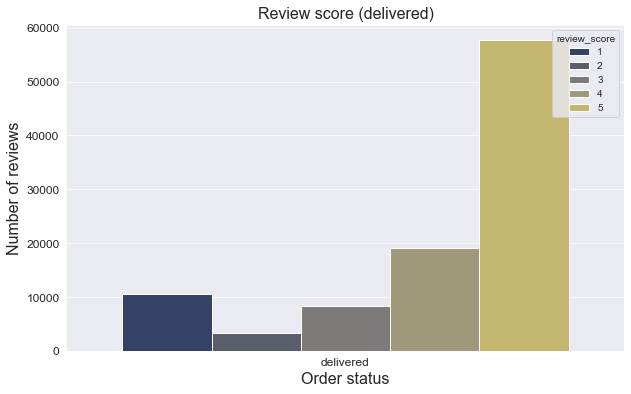

5    57886
4    19310
1    12081
3     8515
2     3403
Name: review_score, dtype: int64

In [10]:
sns.set_style('darkgrid')
ax = sns.countplot(x='order_status', data=df[df['order_status'] == 'delivered'], hue='review_score', palette='cividis')

plt.title('Review score (delivered)', fontsize=16)
plt.xlabel('Order status', fontsize=16)
plt.ylabel('Number of reviews', fontsize=16)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='review_score', loc='upper right')
plt.show()
df.review_score.value_counts()

In [11]:
def partition(x):
    if x < 3:
        return 0
    return 1
df['review_score']= df['review_score'].map(lambda cw : partition(cw) ) 
    
df.review_score.value_counts()

1    85711
0    15484
Name: review_score, dtype: int64

Total Positive Reviews : 85711 , ( 84.69884875734968 %)
Total Negative Reviews : 15484 , ( 15.301151242650329 %)


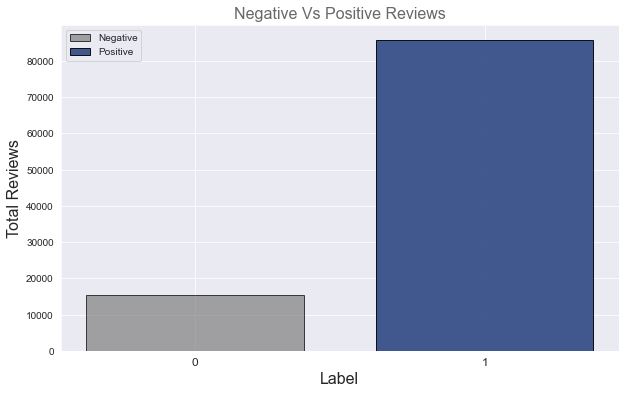

In [12]:
y_value_counts = df.review_score.value_counts()

#calculating the percentage of each review type
print("Total Positive Reviews :", y_value_counts[1], ", (", (y_value_counts[1]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")
print("Total Negative Reviews :", y_value_counts[0], ", (", (y_value_counts[0]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")


sns.set_style('darkgrid')
plt.ylabel('Total Reviews', fontsize= 16)
plt.xlabel('Label', fontsize = 16)
plt.title('Negative Vs Positive Reviews',color='dimgrey', fontsize= 16)
plt.xticks([10,10.20],['0','1'], fontsize = 12)

plt.bar(10,15484, color = 'grey', width = 0.15,alpha=0.7,label='Negative',edgecolor='black')
plt.bar(10.20,85711,color = '#2e4884', width = 0.15,alpha=0.9,label='Positive',edgecolor='black')
plt.legend()

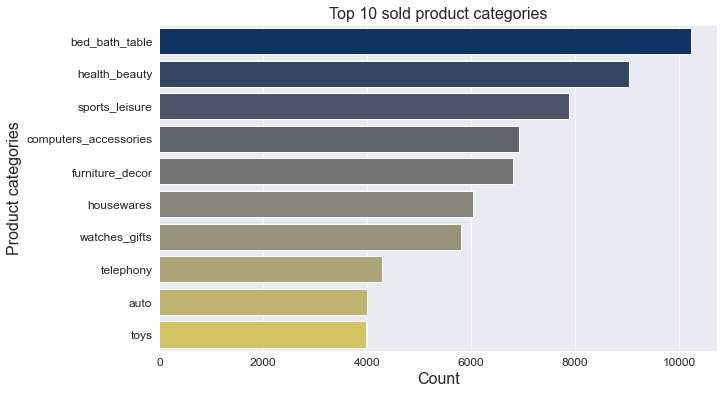

In [13]:
sns.set_style('darkgrid')
product_categories = list(df['category_name'].value_counts()[:10].index)

sns.countplot(y = 'category_name',
              data=df,
              order=product_categories,
              palette='cividis')
plt.title('Top 10 sold product categories', fontsize=16)
plt.xlabel('Count', fontsize=16)
plt.ylabel('Product categories', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

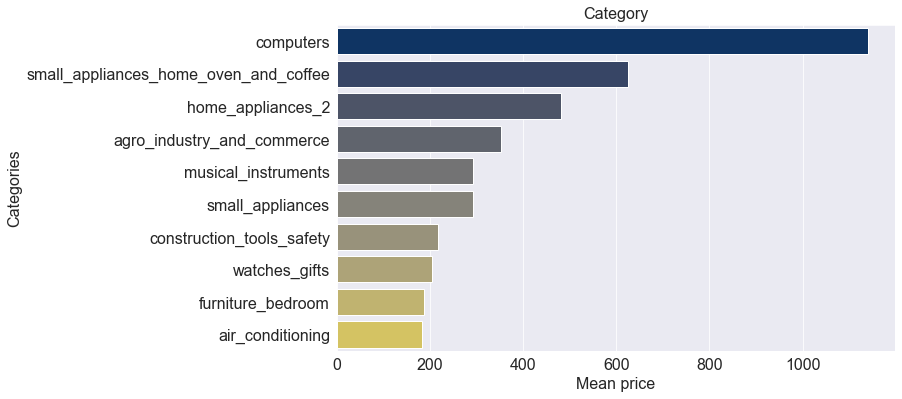

In [14]:
grp_cat_name = df.groupby('category_name')
grp_dict = dict(grp_cat_name.mean()['price'].sort_values(ascending=False)[:10])
sns.barplot(y=list(grp_dict.keys()),x=list(grp_dict.values()), palette='cividis')
plt.title('Category', fontsize=16)
plt.xlabel('Mean price', fontsize=16)
plt.ylabel('Categories', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

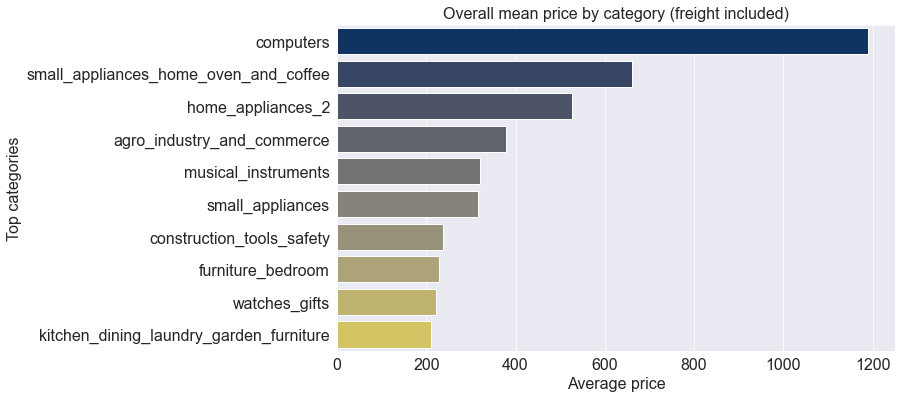

In [15]:
grp_dict = dict((grp_cat_name.mean()['price']+grp_cat_name.mean()['freight_price']).sort_values(ascending=False)[:10])
sns.barplot(y=list(grp_dict.keys()),x=list(grp_dict.values()), palette='cividis')
plt.title('Overall mean price by category (freight included)', fontsize=16)
plt.xlabel('Average price', fontsize=16)
plt.ylabel('Top categories', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

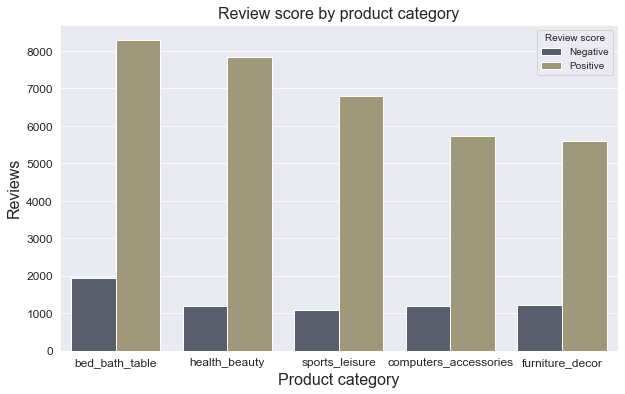

In [16]:
sns.set_style("darkgrid")
product_cat = list(df['category_name'].value_counts()[:5].index)


ax = sns.countplot(x ='category_name',
            hue='review_score',
            order=product_cat,
            palette='cividis',
            data=df)
plt.title('Review score by product category', fontsize=16)
plt.xlabel('Product category', fontsize=16)
plt.ylabel('Reviews', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Review score', labels=['Negative', 'Positive'],loc='upper right')
plt.show()

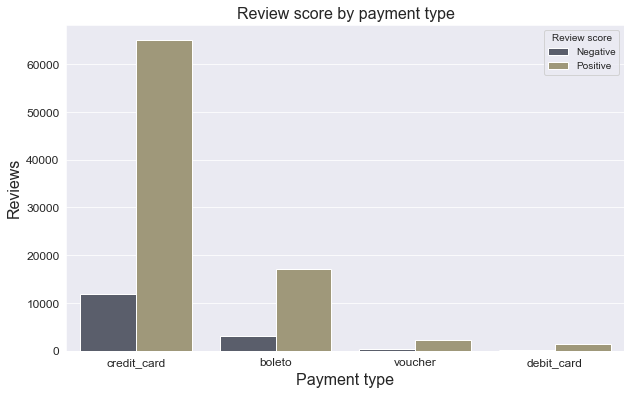

In [17]:
sns.set_style("darkgrid")
payment_types = list(df['payment_type'].value_counts().index)


ax = sns.countplot(x ='payment_type',
            hue='review_score',
            order=payment_types,
            palette='cividis',
            data=df)
plt.title('Review score by payment type', fontsize=16)
plt.xlabel('Payment type', fontsize=16)
plt.ylabel('Reviews', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Review score',labels=['Negative', 'Positive'], loc='upper right')
plt.show()

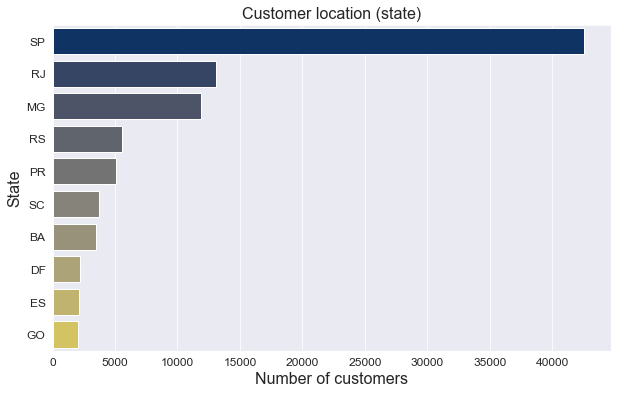

In [18]:
sns.set_style('darkgrid')
state = list(df['customer_state'].value_counts()[:10].index)

sns.countplot(y = 'customer_state',
              data=df,
              order=state,
              palette='cividis')
plt.title('Customer location (state)', fontsize=16)
plt.xlabel('Number of customers', fontsize=16)
plt.ylabel('State', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

Text(0.5, 0, 'Price')

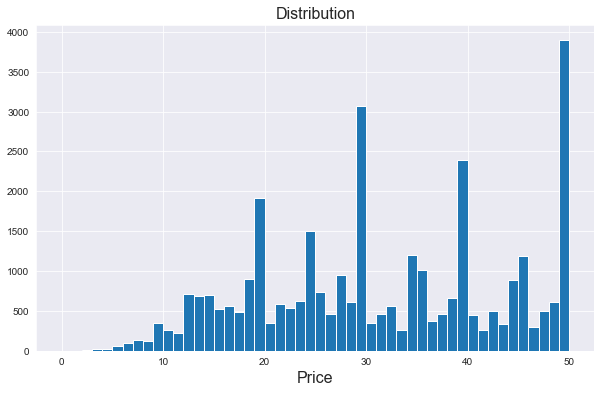

In [21]:
fig, ax = plt.subplots()
ax.hist(df.price, bins = 50, range = [0,50], label = 'price')
plt.title('Distribution', fontsize = 16)
ax.set_xlabel('Price', fontsize = 16)

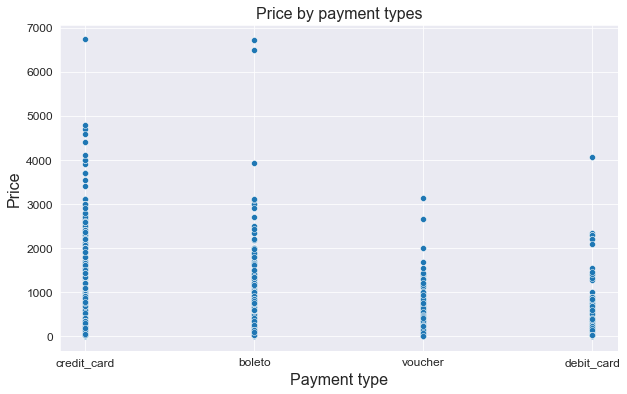

In [22]:
plt.figure()
sns.scatterplot(x='payment_type', y='price',data=df)
plt.title('Price by payment types', fontsize=16)
plt.xlabel('Payment type', fontsize=16)
plt.ylabel('Price', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [23]:
for i in range(0, 101, 10):
    print(i,'th percentile is',np.percentile(df['price'].values, i))

0 th percentile is 0.85
10 th percentile is 24.5
20 th percentile is 35.0
30 th percentile is 49.0
40 th percentile is 59.9
50 th percentile is 78.5
60 th percentile is 99.0
70 th percentile is 119.99
80 th percentile is 159.0
90 th percentile is 238.06000000000057
100 th percentile is 6735.0


In [24]:
for i in range(90,101):
    print(i,'th percentile is',np.percentile(df['price'].values, i))

90 th percentile is 238.06000000000057
91 th percentile is 250.0
92 th percentile is 274.49
93 th percentile is 299.0
94 th percentile is 329.0
95 th percentile is 359.99
96 th percentile is 405.92159999999916
97 th percentile is 514.6913999999983
98 th percentile is 649.0
99 th percentile is 899.0
100 th percentile is 6735.0


In [25]:
df2 = df.loc[df['order_status'] == 'delivered']

In [26]:
df2.drop(df2[df2.payment_sequential > 4].index,inplace=True)

In [25]:
#df2['log_price'] = np.log(df2['price']+1)

In [26]:
#df2 =df2.loc[df2['category_name'] == 'toys']

In [27]:
df2.drop(df2[df2.price > 30].index, inplace=True)

In [28]:
df2.drop(
    ['order_id','product_id','transaction_value','seller_id','customer_city','customer_state','order_item_id','category_name','customer_id', 'order_status', 'order_purchase_timestamp',
     'order_approved_at', 'delivered_to_carrier_date', 'delivered_to_customer_date',
     'estimated_delivery_date','customer_unique_id','shipping_limit_date','product_category_name',
     'customer_zip_code_prefix','review_comment_title','review_comment_message','review_answer_timestamp','review_creation_date','review_id'], axis = 1, inplace = True)

In [29]:
print('Total count of missing records:',df2.isnull().sum().sum())

Total count of missing records: 0


In [30]:
df2.isnull().sum()

payment_sequential            0
payment_type                  0
installments                  0
price                         0
freight_price                 0
product_name_lenght           0
product_description_lenght    0
product_photos_qty            0
product_weight_g              0
product_length_cm             0
product_height_cm             0
product_width_cm              0
review_score                  0
dtype: int64

In [31]:
#df2.fillna(method='ffill', inplace=True)

In [32]:
df2.describe()

,payment_sequential,installments,price,freight_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score
count,17053.000000,17053.000000,17053.000000,17053.000000,17053.000000,17053.000000,17053.000000,17053.000000,17053.000000,17053.000000,17053.000000,17053.000000
mean,1.017592,1.741922,21.726390,14.090311,48.189585,606.180437,2.076937,389.709494,23.214742,10.085322,17.222483,0.863719
std,0.148241,1.487795,6.411424,6.187677,10.272461,524.810464,1.624334,792.951602,11.111434,7.518937,7.142684,0.343097
min,1.000000,1.000000,0.850000,0.020000,8.000000,15.000000,1.000000,50.000000,11.000000,2.000000,7.000000,0.000000
25%,1.000000,1.000000,16.900000,8.880000,42.000000,295.000000,1.000000,150.000000,17.000000,4.000000,12.000000,1.000000
50%,1.000000,1.000000,21.990000,14.100000,51.000000,458.000000,1.000000,213.000000,19.000000,8.000000,15.000000,1.000000
75%,1.000000,2.000000,27.900000,16.370000,56.000000,776.000000,3.000000,350.000000,25.000000,13.000000,20.000000,1.000000
max,4.000000,24.000000,30.000000,112.430000,67.000000,3985.000000,15.000000,19575.000000,105.000000,85.000000,91.000000,1.000000


In [33]:
df2.reset_index(inplace = True, drop = True)

In [34]:
df2.head()

,payment_sequential,payment_type,installments,price,freight_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score
0,1,credit_card,1,29.99,8.72,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1
1,1,credit_card,3,29.99,7.78,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1
2,1,credit_card,1,29.99,7.78,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1
3,1,boleto,1,29.99,14.10,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1
4,1,voucher,1,19.90,8.72,59.0,299.0,1.0,350.0,33.0,4.0,20.0,0


In [35]:
df2.shape

(17053, 13)

In [36]:
df2.dtypes

payment_sequential              int64
payment_type                   object
installments                    int64
price                         float64
freight_price                 float64
product_name_lenght           float64
product_description_lenght    float64
product_photos_qty            float64
product_weight_g              float64
product_length_cm             float64
product_height_cm             float64
product_width_cm              float64
review_score                    int64
dtype: object

In [37]:
dummies = pd.get_dummies(df2['payment_type'])

In [38]:
dummies.head()

,boleto,credit_card,debit_card,voucher
0,0,1,0,0
1,0,1,0,0
2,0,1,0,0
3,1,0,0,0
4,0,0,0,1


In [39]:
df3 = pd.concat([df2,dummies], axis=1)

In [40]:
df3.head()

,payment_sequential,payment_type,installments,price,freight_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score,boleto,credit_card,debit_card,voucher
0,1,credit_card,1,29.99,8.72,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1,0,1,0,0
1,1,credit_card,3,29.99,7.78,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1,0,1,0,0
2,1,credit_card,1,29.99,7.78,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1,0,1,0,0
3,1,boleto,1,29.99,14.10,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1,1,0,0,0
4,1,voucher,1,19.90,8.72,59.0,299.0,1.0,350.0,33.0,4.0,20.0,0,0,0,0,1


In [41]:
df4 = df3.drop(['payment_type','voucher'], axis = 1)

In [42]:
df4.head()

,payment_sequential,installments,price,freight_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score,boleto,credit_card,debit_card
0,1,1,29.99,8.72,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1,0,1,0
1,1,3,29.99,7.78,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1,0,1,0
2,1,1,29.99,7.78,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1,0,1,0
3,1,1,29.99,14.10,40.0,268.0,4.0,500.0,19.0,8.0,13.0,1,1,0,0
4,1,1,19.90,8.72,59.0,299.0,1.0,350.0,33.0,4.0,20.0,0,0,0,0


In [43]:
df4 = shuffle(df4, random_state=2)

In [44]:
df4.head()

,payment_sequential,installments,price,freight_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score,boleto,credit_card,debit_card
5315,1,2,24.90,11.06,42.0,110.0,1.0,400.0,40.0,4.0,30.0,0,0,1,0
12119,1,3,18.90,16.79,44.0,86.0,1.0,125.0,18.0,8.0,12.0,1,0,1,0
14883,1,1,27.90,18.30,59.0,982.0,1.0,150.0,17.0,13.0,13.0,1,1,0,0
319,1,2,28.99,15.11,52.0,557.0,1.0,450.0,25.0,25.0,25.0,1,0,1,0
2389,1,1,19.00,7.87,52.0,700.0,1.0,100.0,32.0,2.0,24.0,1,0,1,0


In [45]:
X = df4.drop('price', axis=1)
y = df4.price

In [46]:
X

,payment_sequential,installments,freight_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score,boleto,credit_card,debit_card
5315,1,2,11.06,42.0,110.0,1.0,400.0,40.0,4.0,30.0,0,0,1,0
12119,1,3,16.79,44.0,86.0,1.0,125.0,18.0,8.0,12.0,1,0,1,0
14883,1,1,18.30,59.0,982.0,1.0,150.0,17.0,13.0,13.0,1,1,0,0
319,1,2,15.11,52.0,557.0,1.0,450.0,25.0,25.0,25.0,1,0,1,0
2389,1,1,7.87,52.0,700.0,1.0,100.0,32.0,2.0,24.0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14696,1,1,15.10,26.0,740.0,1.0,400.0,23.0,2.0,16.0,1,0,1,0
1099,1,1,18.23,48.0,325.0,1.0,350.0,17.0,22.0,22.0,1,0,1,0
11798,1,1,22.06,41.0,318.0,1.0,125.0,21.0,13.0,18.0,0,0,1,0
6637,1,1,7.39,52.0,303.0,1.0,100.0,16.0,35.0,11.0,1,0,1,0


In [47]:
y

5315     24.90
12119    18.90
14883    27.90
319      28.99
2389     19.00
         ...  
14696    18.20
1099     18.90
11798    18.90
6637     18.00
2575     24.99
Name: price, Length: 17053, dtype: float64

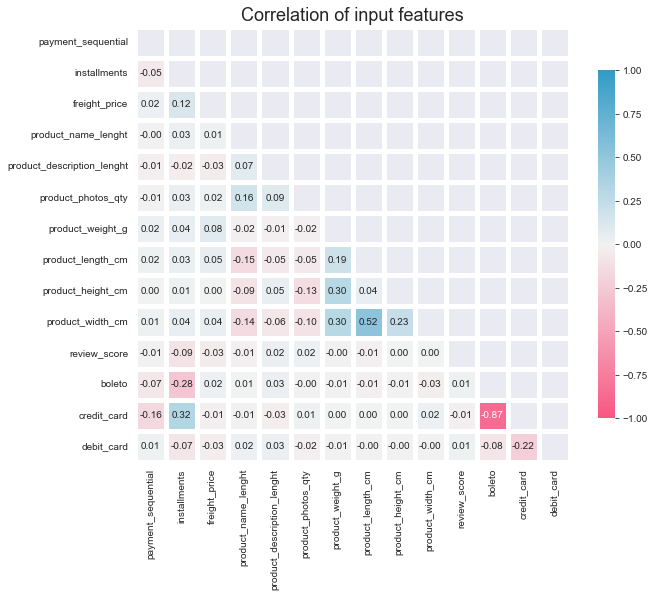

In [48]:
fig, ax = plt.subplots(figsize=(10, 8))
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

cor = X.corr(method='pearson')
#Plot heatmap.
matrix = np.triu(cor)
sns.heatmap(cor, annot=True, mask=matrix, fmt=".2f", 
           linewidths=5, cmap=cmap, vmin=-1, vmax=1, 
           cbar_kws={"shrink": .8}, square=True)



# Title
title = 'Correlation of input features'
plt.title(title, loc='center', fontsize=18)
plt.show()

In [49]:
X.drop(
    ['product_width_cm'], axis = 1, inplace = True)

In [50]:
rf = RandomForestRegressor(n_estimators=100)

In [51]:
rf.fit(X,y)

RandomForestRegressor()

In [52]:
rf.feature_importances_

array([0.00194235, 0.02570474, 0.07759065, 0.14756969, 0.23022956,
       0.06654984, 0.16442213, 0.12885304, 0.13799321, 0.00658036,
       0.00549814, 0.00540806, 0.00165825])

In [53]:
feature_importances = pd.DataFrame(rf.feature_importances_, index =X.columns,  columns=['importance']).sort_values('importance', ascending=False)


In [54]:
feature_importances

,importance
product_description_lenght,0.230230
product_weight_g,0.164422
product_name_lenght,0.147570
product_height_cm,0.137993
product_length_cm,0.128853
freight_price,0.077591
product_photos_qty,0.066550
installments,0.025705
review_score,0.006580
boleto,0.005498


In [55]:
X.drop(
    ['payment_sequential','freight_price','installments','product_photos_qty','review_score','boleto','credit_card','debit_card'], axis = 1, inplace = True)

In [56]:
X.head()

,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm
5315,42.0,110.0,400.0,40.0,4.0
12119,44.0,86.0,125.0,18.0,8.0
14883,59.0,982.0,150.0,17.0,13.0
319,52.0,557.0,450.0,25.0,25.0
2389,52.0,700.0,100.0,32.0,2.0


In [57]:
X.head()

,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm
5315,42.0,110.0,400.0,40.0,4.0
12119,44.0,86.0,125.0,18.0,8.0
14883,59.0,982.0,150.0,17.0,13.0
319,52.0,557.0,450.0,25.0,25.0
2389,52.0,700.0,100.0,32.0,2.0


In [58]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=2)

In [59]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train[['product_name_lenght','product_description_lenght','product_weight_g','product_length_cm','product_height_cm']])
X_test = sc.transform (X_test[['product_name_lenght','product_description_lenght','product_weight_g','product_length_cm','product_height_cm']])

In [60]:
X_train

array([[-1.3843612 ,  0.44727409, -0.29830305, -0.64770221, -1.07100435],
       [ 0.5670087 ,  0.60277097,  0.94215115, -0.64770221,  0.91820926],
       [-0.70138173, -0.14015859, -0.29830305, -0.64770221, -0.54054739],
       ...,
       [-2.55518314, -0.71223355, -0.29830305, -0.55799072, -0.80577587],
       [ 0.6645772 , -0.41851721, -0.17425763, -0.64770221, -0.67316163],
       [-1.09165572, -0.81397842, -0.36032576, -0.19914477, -0.93839011]])

In [61]:
print('Training set has {} samples.'.format(X_train.shape[0])) 
print('Testing set has {} samples.'.format(X_test.shape[0]))
print('Training set has {} samples.'.format(X_train.shape)) 
print('Testing set has {} samples.'.format(X_test.shape))

Training set has 13642 samples.
Testing set has 3411 samples.
Training set has (13642, 5) samples.
Testing set has (3411, 5) samples.


In [62]:
start_time = time.time()
gsc = GridSearchCV(estimator=SVR(kernel='rbf'),param_grid={'C': [0.001,0.01,0.1,1,10,100],
'epsilon': [0.001,0.01,0.05,0.1,1,10],
'gamma': [0.01, 0.1, 1, 10, 100]},cv=5,verbose=0, n_jobs=-1)

gsc_results = gsc.fit(X_train, y_train)
print(f'GridSearchCV finished in : {round((time.time() - start_time), 2)} seconds...')

GridSearchCV finished in : 1091.87 seconds...


In [63]:
print('Best parameters: {}'.format(gsc_results.best_params_))
print('Best cross-validation score: {:.2f}'.format(gsc_results.best_score_))


Best parameters: {'C': 100, 'epsilon': 0.1, 'gamma': 100}
Best cross-validation score: 0.68


In [64]:
print('Test set score: {:.2f}'.format(gsc_results.score(X_test, y_test)))

Test set score: 0.68


In [65]:
print('Training score: {:.2f}'.format(gsc_results.score(X_train, y_train)))

Training score: 0.95


In [66]:
start_time = time.time()
svr = SVR(kernel = 'rbf',C=100, epsilon=0.1, gamma = 100)
svr.fit(X_train, y_train)

y_pred_train = svr.predict(X_train)

y_pred_test = svr.predict(X_test)

#Metrics - if squared = True returns MSE value, if squared = False returns RMSE value.
#Performance on training set
mae_train = mean_absolute_error(y_train,y_pred_train)
rmse_train = mean_squared_error(y_train,y_pred_train, squared = False)

#Performance on testing set 
mae_test = mean_absolute_error(y_test, y_pred_test)
rmse_test = mean_squared_error(y_test, y_pred_test, squared = False)

print(f'SVR completed in : {round((time.time() - start_time), 2)} seconds...')

SVR completed in : 26.19 seconds...


In [67]:
train_metrics = pd.DataFrame({'MAE': mae_train,'RMSE': rmse_train}, index=[0])
train_metrics.reset_index(drop=True, inplace=True)
train_metrics.head()

,MAE,RMSE
0,0.533695,1.48447


In [68]:
test_metrics = pd.DataFrame({'MAE': mae_test,'RMSE': rmse_test}, index=[0])
test_metrics.reset_index(drop=True, inplace=True)
test_metrics.head()

,MAE,RMSE
0,1.865879,3.604662


In [69]:
comp_train = pd.DataFrame({'Original(train)': y_train, 'Predicted(train)': y_pred_train})
comp_train.reset_index(drop=True, inplace=True)
comp_train.head(5)

,Original(train),Predicted(train)
0,29.90,29.800255
1,29.70,29.599960
2,8.50,8.600113
3,19.89,19.989950
4,19.99,20.089968


In [70]:
comp_test = pd.DataFrame({'Original(test)': y_test, 'Predicted(test)': y_pred_test})
comp_test.reset_index(drop=True, inplace=True)
comp_test.head(5)

,Original(test),Predicted(test)
0,14.90,20.938668
1,23.40,20.887531
2,20.89,20.982803
3,18.32,20.978714
4,18.00,18.099879


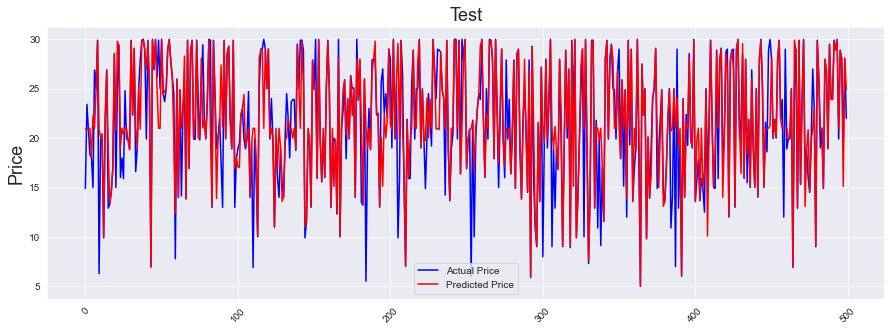

In [71]:
plt.figure(figsize=(15,5))
plt.plot(range(500),comp_test['Original(test)'].values[0:500], label='Actual Price', color='blue')
plt.plot(range(500),comp_test['Predicted(test)'].values[0:500], label='Predicted Price', color='red')
plt.title('Test',fontsize=18)
plt.ylabel('Price',fontsize=18)
plt.xticks(rotation=45)
plt.legend()
plt.show()